In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt

# This is a Colab Notebook
End-to-end multi-class image classifier (dog breed identification) using tensorflow and tensorflow hub.
## 1. Problem:
Identifying the breed of a dog though an image.
## 2. Data:
Using data from dog breed identification competition on kaggle.
source: https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation:
evaluated on Multi Class Log Loss between the predicted probability and the observed target.
source: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation
## 4. Features:
* We are dealing with image data (unstructured data), it's best to use deep learning/transfer learning.
* There are 120 breeds of dog (this means there are 120 different classes).
* There are 10,222 train sample images.
* There are 10,357 test images.
images have no label.







In [2]:
# Unzipping the data in our google drive:
#!unzip "/content/drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/My Drive/Dog Vision/"

### Getting our workspace ready

In [3]:
# Importing TensorFlow into Colab
import tensorflow as tf
print("TensorFlow Version:", tf.__version__)

TensorFlow Version: 2.2.0


In [4]:
import tensorflow_hub as hub
print("TensorFlowHub Version:", hub.__version__)

TensorFlowHub Version: 0.8.0


In [5]:
# Checking for GPU availabilty
print("GPU", "available :)" if tf.config.list_physical_devices("GPU") else "not available :(")


GPU not available :(


In [7]:
#Importing labels.csv
labels = pd.read_csv("labels.csv")
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,c0ca40ffa35be4d2772870794fa298cf,scottish_deerhound
freq,1,126


In [9]:
labels.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
komondor                 67
golden_retriever         67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

Text(0, 0.5, 'Total Count of Dogs')

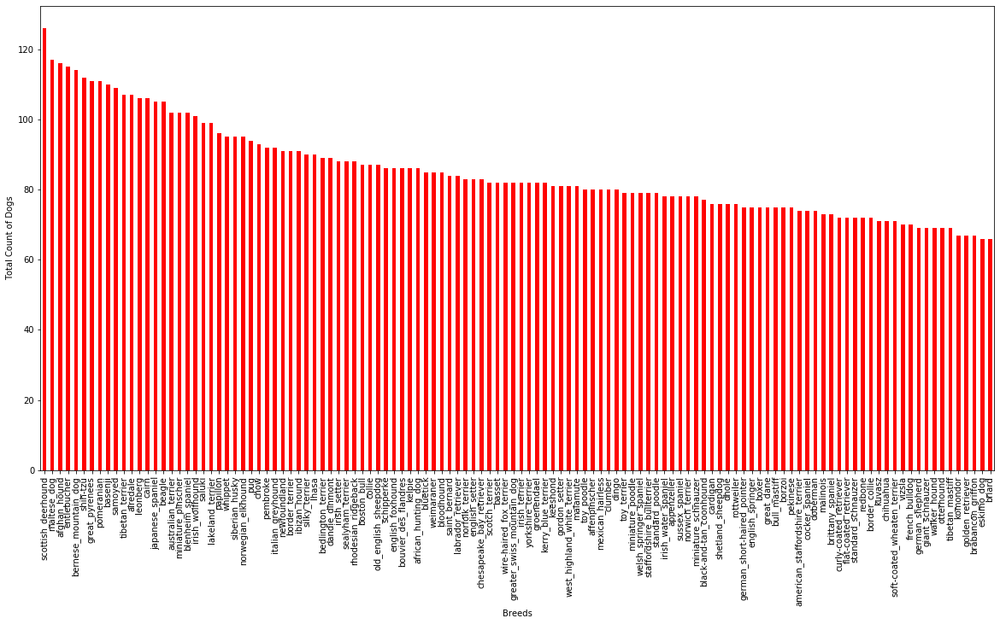

In [10]:
labels.breed.value_counts().plot(kind="bar",figsize=(20,10), color="red")
plt.xlabel("Breeds")
plt.ylabel("Total Count of Dogs")

In [11]:
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

FileNotFoundError: No such file or directory: 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'

FileNotFoundError: No such file or directory: 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'

<IPython.core.display.Image object>

In [17]:
filename = ["train/" + fname + ".jpg" for fname in labels.id]
len(filename)

10222

In [18]:
import os
if(len(os.listdir("train/"))) == len(filename):
  print("Filenames match actual amount of file: Proceed!")
else:
  print("Filenames doesn\'t match actual amount of files: Check the directory.")

Filenames match actual amount of file: Proceed!


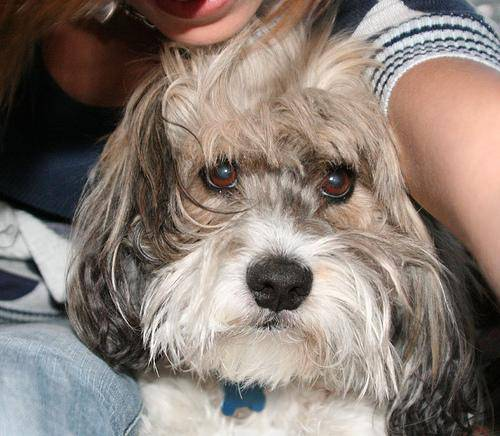

In [19]:
Image(filename[900])

In [20]:
breed = np.array(labels.breed)
breed

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
len(breed)

10222

In [22]:
labels.isna().sum()

id       0
breed    0
dtype: int64

In [23]:
unique_breed = np.unique(breed)
unique_breed

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [24]:
len(unique_breed)

120

### Turning single label(breed) into booleans

In [25]:
breed[10000] == unique_breed

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [26]:
breed_booleans = [x == unique_breed for x in breed]
len(breed_booleans)

10222

In [27]:
breed_booleans[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [28]:
# converting booleans to integers:
print(breed[0])
print(np.where(unique_breed == breed[0]))
print(breed_booleans[0].argmax())
print(breed_booleans[0].astype(int))

boston_bull
(array([19], dtype=int64),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [29]:
# Creating X & Y labels:
X = filename
Y = breed_booleans

### Creating a Validation Set
because data from kaggle doesn't provide a validation set

In [30]:
NUM_IMAGE = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [31]:
# Splitting our Data
from sklearn.model_selection import train_test_split

X_train, X_valid, Y_train, Y_valid = train_test_split(X[:NUM_IMAGE],
                                                      Y[:NUM_IMAGE],
                                                      test_size=0.2,
                                                      random_state=61)
len(X_train), len(Y_train), len(X_valid), len(Y_valid)

(800, 800, 200, 200)

In [32]:
X_train[:5], Y_train[0]

(['train/04d2dc1f2804c748b1aa71954bb45d38.jpg',
  'train/16df5020c2b6ac3f70fb3a5c27c5175e.jpg',
  'train/0ddbc4702eff570783cd03645571e7f7.jpg',
  'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
  'train/0325e6ba5b6afd3e0dd94c3a77b6de59.jpg'],
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,

## Preprocessing Images
* ## Turning Images into Tensors

In [33]:
from matplotlib.pyplot import imread
image = imread(filename[61])
image.shape

(280, 200, 3)

In [34]:
image.max(), image.min()

(255, 0)

In [35]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 200, 3), dtype=uint8, numpy=
array([[[242, 241, 239],
        [242, 241, 239],
        [242, 241, 239],
        ...,
        [249, 251, 250],
        [249, 251, 250],
        [250, 252, 251]],

       [[242, 241, 239],
        [242, 241, 239],
        [242, 241, 239],
        ...,
        [248, 250, 249],
        [249, 251, 250],
        [249, 251, 250]]], dtype=uint8)>

In [36]:
image[:2]

array([[[242, 241, 239],
        [242, 241, 239],
        [242, 241, 239],
        ...,
        [249, 251, 250],
        [249, 251, 250],
        [250, 252, 251]],

       [[242, 241, 239],
        [242, 241, 239],
        [242, 241, 239],
        ...,
        [248, 250, 249],
        [249, 251, 250],
        [249, 251, 250]]], dtype=uint8)

In [40]:
# Setting Image Size:
#IMG_SIZE = [224,224]
# Function for preprocessing the  images:
def preprocess_img(image_path, IMG_SIZE = [224,224]):
  """
  Takes an Image file path and converts it into a tensor.
  """
  # reading a filepath
  image = tf.io.read_file(image_path)
  # converting images into tensors
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalizing the images from 0-255 to 0-1 float values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resizing the image
  image = tf.image.resize(image, size= IMG_SIZE)  
  return image

In [41]:
#tensor = tf.io.read_file(filename[24])
#tensor
#tensor = tf.image.decode_jpeg(tensor, channels=3)
# tf.image.convert_image_dtype(tensor, tf.float32)

### Turning pr Data into Batches
* processing 32 images at a time

In [42]:
def get_image_label(image_path, label):
  #label = tf.constant(label)
  image = preprocess_img(image_path)
  return image, label

In [43]:
get_image_label(X[61],tf.constant(Y[61]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.9450981 , 0.94117653, 0.92549026],
         [0.9450981 , 0.94117653, 0.92549026],
         [0.94796926, 0.9440477 , 0.9283614 ],
         ...,
         [0.9681373 , 0.9838236 , 0.979902  ],
         [0.9681373 , 0.9838236 , 0.979902  ],
         [0.9681373 , 0.9838236 , 0.979902  ]],
 
        [[0.9450981 , 0.94117653, 0.92549026],
         [0.9450981 , 0.94117653, 0.92549026],
         [0.94796926, 0.9440477 , 0.9283614 ],
         ...,
         [0.9632354 , 0.97892165, 0.9750001 ],
         [0.9632354 , 0.97892165, 0.9750001 ],
         [0.9632354 , 0.97892165, 0.9750001 ]],
 
        [[0.9450981 , 0.94117653, 0.92549026],
         [0.9450981 , 0.94117653, 0.92549026],
         [0.94796926, 0.9440477 , 0.9283614 ],
         ...,
         [0.9583334 , 0.97401965, 0.9700981 ],
         [0.9583334 , 0.97401965, 0.9700981 ],
         [0.9583334 , 0.97401965, 0.9700981 ]],
 
        ...,
 
        [[0.13186276, 0.13186276

In [44]:
BATCH_SIZE = 32
# Creating func to turn data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data= False, test_data= False):
  """
  creates  batch of data
  """
  if test_data:
    print("Creating Test Data Batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(preprocess_img).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating Valid Data Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating Training Data Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [45]:
train_data = create_data_batches(X_train, Y_train)
valid_data = create_data_batches(X_valid, Y_valid, valid_data= True)

Creating Training Data Batches...
Creating Valid Data Batches...


In [46]:
print(train_data.element_spec)
print(valid_data.element_spec)

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))


## Visualizing our data batches

In [47]:
def show_images(image, label):
  """
  display 25 images from batch samples:
  """
  plt.figure(figsize=(15,15))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.title(unique_breed[label[i].argmax()])
    plt.axis("off")

In [48]:
train_image, train_label = next(train_data.as_numpy_iterator())
len(train_image), len(train_label)

(32, 32)

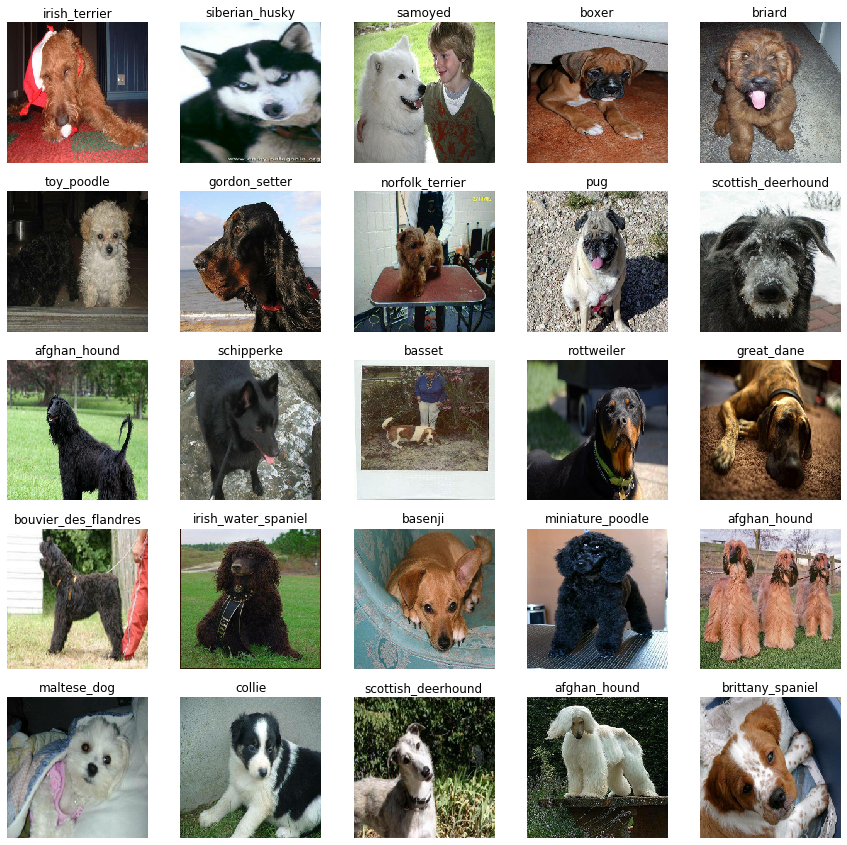

In [49]:
show_images(train_image, train_label)

In [50]:
valid_image, valid_label = next(valid_data.as_numpy_iterator())
len(valid_image), len(valid_label)

(32, 32)

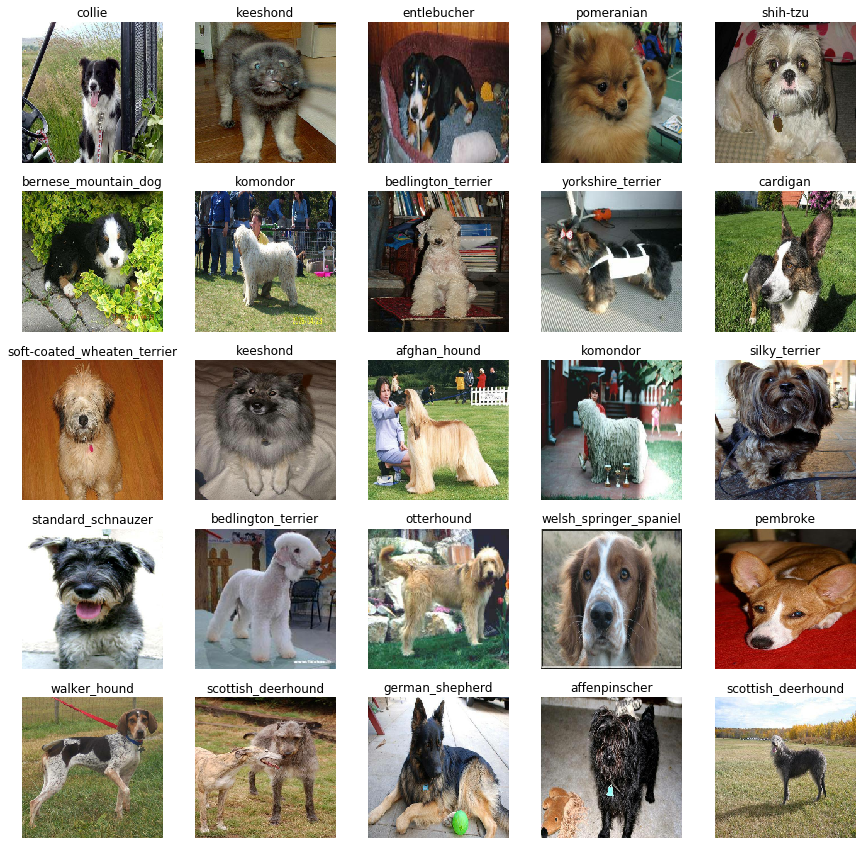

In [51]:
show_images(valid_image, valid_label)

### Preparing Inputs ans Outputs:


In [52]:
INPUT_SHAPE = [None, 224, 224, 3]
OUTPUT_SHAPE = len(unique_breed)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## Creating DL model:

In [53]:
def create_model(input_shape= INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building Model with:", model_url)
  model = tf.keras.Sequential([hub.KerasLayer(model_url), #Layer 1 (input layer)
                               tf.keras.layers.Dense(units= output_shape,
                               activation= "softmax")])  #Layer 2 (output layer)
  # Compiling the Model:
  model.compile(loss= tf.keras.losses.CategoricalCrossentropy(),
                optimizer= tf.keras.optimizers.Adam(),
                metrics= ["accuracy"])
  # Building the Model:
  model.build(input_shape)
  return model

In [54]:
model = create_model()
model.summary()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     multiple                  5432713   
_________________________________________________________________
dense (Dense)                multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
* `helper function` a model can use during training to do things such as save its progress, check its progress and stop training when model is not improving.
* using `tensorboard` to prevent our model from training for too long.

In [55]:
# Loading TensorBoard
%load_ext tensorboard

In [56]:
import datetime
def tensorboard_callback():
  """
  To build a tensorboard callback:
  """
  logdir= os.path.join("logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
* to prevent overfitting
* source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [57]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "val_accuracy", patience= 3)

### Traing the model on a subset of the data:
* using only 1000 training samples

In [58]:
NUM_EPOCH = 100 #@param {type:"slider", min:10, max:100, step:10}

### Training and checking progress:

In [59]:
def train_model():
  """
  Trains a given model and returns a trained version
  """
  # creating a model:
  model = create_model()
  # creating a tensorboard session:
  tensorboard = tensorboard_callback()
  # fitting the model by passing the callbacks :
  model.fit(x=train_data,
            epochs= NUM_EPOCH,
            validation_data= valid_data,
            validation_freq= 1,
            callbacks= [tensorboard, early_stopping])
  return model


In [60]:
model = train_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 65s 3s/step - loss: 4.6064 - accuracy: 0.0913 - val_loss: 3.3629 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 56s 2s/step - loss: 1.6645 - accuracy: 0.6950 - val_loss: 2.0812 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 57s 2s/step - loss: 0.5788 - accuracy: 0.9362 - val_loss: 1.5397 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 56s 2s/step - loss: 0.2596 - accuracy: 0.9887 - val_loss: 1.3535 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 58s 2s/step - loss: 0.1497 - accuracy: 0.9975 - val_loss: 1.2624 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 56s 2s/step - loss: 0.1022 - accuracy: 0.9987 - val_loss: 1.2236 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================] - 56s 2s/s

In [61]:
%tensorboard --logdir /logs

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 19188.

In [62]:
prediction = model.predict(valid_data, verbose=1)
prediction

7/7 [==============================] - 10s 1s/step


array([[7.34558780e-05, 1.14699971e-04, 1.43983620e-04, ...,
        3.02723347e-04, 1.94596112e-04, 4.61246145e-06],
       [2.61413679e-03, 4.16817609e-04, 8.80597916e-04, ...,
        1.20008546e-04, 3.36704070e-05, 6.90583466e-03],
       [5.98750157e-05, 6.17429032e-05, 5.87581562e-05, ...,
        3.79727891e-04, 2.68533709e-04, 1.90808205e-05],
       ...,
       [3.37003657e-05, 2.17431923e-04, 1.25495915e-03, ...,
        2.38539233e-05, 5.44511095e-05, 3.30065268e-05],
       [1.45683240e-03, 1.51654496e-03, 1.59296513e-04, ...,
        9.82582453e-04, 3.86627289e-05, 8.36220352e-05],
       [4.04148735e-03, 3.77971330e-04, 8.25669209e-04, ...,
        7.56411755e-04, 3.32531519e-04, 1.96537143e-03]], dtype=float32)

In [63]:
prediction.shape

(200, 120)

In [64]:
print(prediction[0])

[7.34558780e-05 1.14699971e-04 1.43983620e-04 4.82223113e-05
 2.90043745e-03 2.75329826e-03 1.04300648e-06 2.03641714e-03
 1.79647286e-05 4.36969003e-06 2.30146306e-05 5.22752816e-04
 7.65979166e-06 2.33447645e-04 4.48906030e-05 8.24132119e-04
 8.92998219e-01 1.97626359e-05 2.97083643e-05 2.36309734e-05
 1.91388626e-05 1.27598987e-05 1.90791252e-05 2.52543141e-05
 9.69557514e-05 7.55761039e-06 1.02034952e-04 6.42714032e-04
 4.81251685e-04 4.92643798e-04 1.20055374e-04 1.15437788e-05
 1.04059218e-04 5.11992574e-02 1.64841513e-05 7.76818561e-05
 3.31504853e-05 7.30749452e-05 8.77433864e-04 1.33691545e-04
 1.59307412e-04 2.22798408e-05 3.15438447e-05 2.01608855e-04
 8.42329697e-04 1.17671943e-05 7.63099797e-06 3.93887103e-06
 2.80658205e-05 1.45649118e-03 2.98524560e-06 4.54976216e-05
 3.75882164e-03 2.52817222e-06 6.39399572e-04 5.65798982e-05
 8.64672813e-07 8.30893350e-06 5.89016872e-06 2.26040790e-03
 2.23545649e-05 6.97378069e-04 1.61357850e-04 1.94279040e-04
 2.69714146e-05 2.138086

In [65]:
for index in range(10):
#print(prediction[index])
  print("Maximum value of prediction probability:", np.max(prediction[index]))
  print("Sum of Probabilities of prediction:", np.sum(prediction[index]))
  print("Maximum Value at index", np.argmax(prediction[index]))
  print("Breed:", unique_breed[np.argmax(prediction[index])])

Maximum value of prediction probability: 0.8929982
Sum of Probabilities of prediction: 1.0000006
Maximum Value at index 16
Breed: border_collie
Maximum value of prediction probability: 0.60992676
Sum of Probabilities of prediction: 1.0000001
Maximum Value at index 62
Breed: keeshond
Maximum value of prediction probability: 0.92505705
Sum of Probabilities of prediction: 0.99999964
Maximum Value at index 42
Breed: entlebucher
Maximum value of prediction probability: 0.858008
Sum of Probabilities of prediction: 0.9999996
Maximum Value at index 87
Breed: pomeranian
Maximum value of prediction probability: 0.42771024
Sum of Probabilities of prediction: 0.99999994
Maximum Value at index 100
Breed: shih-tzu
Maximum value of prediction probability: 0.90645164
Sum of Probabilities of prediction: 0.99999976
Maximum Value at index 11
Breed: bernese_mountain_dog
Maximum value of prediction probability: 0.3193573
Sum of Probabilities of prediction: 0.9999999
Maximum Value at index 65
Breed: komondo

In [66]:
unique_breed[10]

'bedlington_terrier'

In [67]:
def get_pred_label(prediction_prob):
  """
  Turning prediction to respective label:
  """
  return unique_breed[np.argmax(prediction_prob)]

In [68]:
get_pred_label(prediction[90])

'american_staffordshire_terrier'

In [69]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [70]:
def unbatchify(data):
  images_ = []
  labels_ = []
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(label)
  return images_, labels_

In [71]:
val_image, val_label = unbatchify(valid_data)
val_image[0], val_label[0]

(array([[[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [0.7604561 , 0.77497053, 0.8483261 ],
         [0.82123023, 0.87087077, 0.9245755 ],
         [0.83445436, 0.89607835, 0.94553626]],
 
        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [0.79672205, 0.82800186, 0.90219307],
         [0.82761776, 0.87584054, 0.9276919 ],
         [0.85742486, 0.90737385, 0.9498348 ]],
 
        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         [1.        , 1.        , 1.        ],
         ...,
         [0.82371885, 0.88791996, 0.9694296 ],
         [0.7516371 , 0.79253864, 0.83243704],
         [0.78149045, 0.8180188 , 0.84793824]],
 
        ...,
 
        [[0.03005798, 0.01687157, 0.05936713],
         [0.04236715, 0.03639747, 0.07706

### Visualising Prediction and Truth Labels

In [72]:
def plot_pred(true, preds, image, n=0):
  """
  Ploting the prediction on images:
  """
  true, preds, image = true[n], preds[n], image[n]
  preds_lab = get_pred_label(preds)
  true_lab = get_pred_label(true)
  # plot
  #plt.figure(figsize=(4,4))
  plt.imshow(image)
  plt.axis("off")
  if true_lab == preds_lab:
    c = "green"
  else: c= "red"
  plt.title(f"{true_lab} {np.max(preds):.2f}% {preds_lab}", color=c, fontweight = "bold")
  return

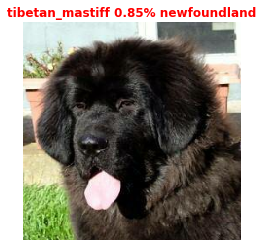

In [73]:
plot_pred(val_label, prediction, val_image, n=61)

In [74]:
def plot_pred_conf(true, preds, n=0):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n:
  """
  pred_prob, true = preds[n], true[n]
  pred_label = get_pred_label(pred_prob)
  true_label = get_pred_label(true)
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]
  top_10_pred_value = pred_prob[top_10_pred_index]
  top_10_pred_label = unique_breed[top_10_pred_index]
  #plot
  #plt.figure(figsize=(6,4))
  top_plot = plt.bar(np.arange(len(top_10_pred_label)),
                     top_10_pred_value,
                     color= "grey")
  plt.xticks(np.arange(len(top_10_pred_label)),
             labels= top_10_pred_label,
             rotation= 'vertical')
  if np.isin(true_label, top_10_pred_label):
    top_plot[np.argmax(top_10_pred_label == true_label)].set_color("green")
  else: pass

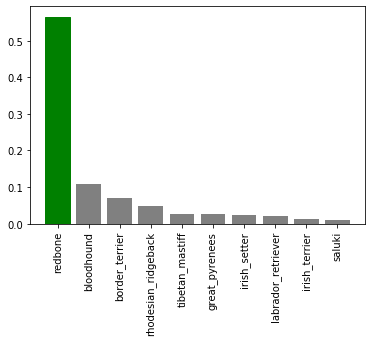

In [141]:
plot_pred_conf(val_label, prediction,190)

#### Combining both the plots:

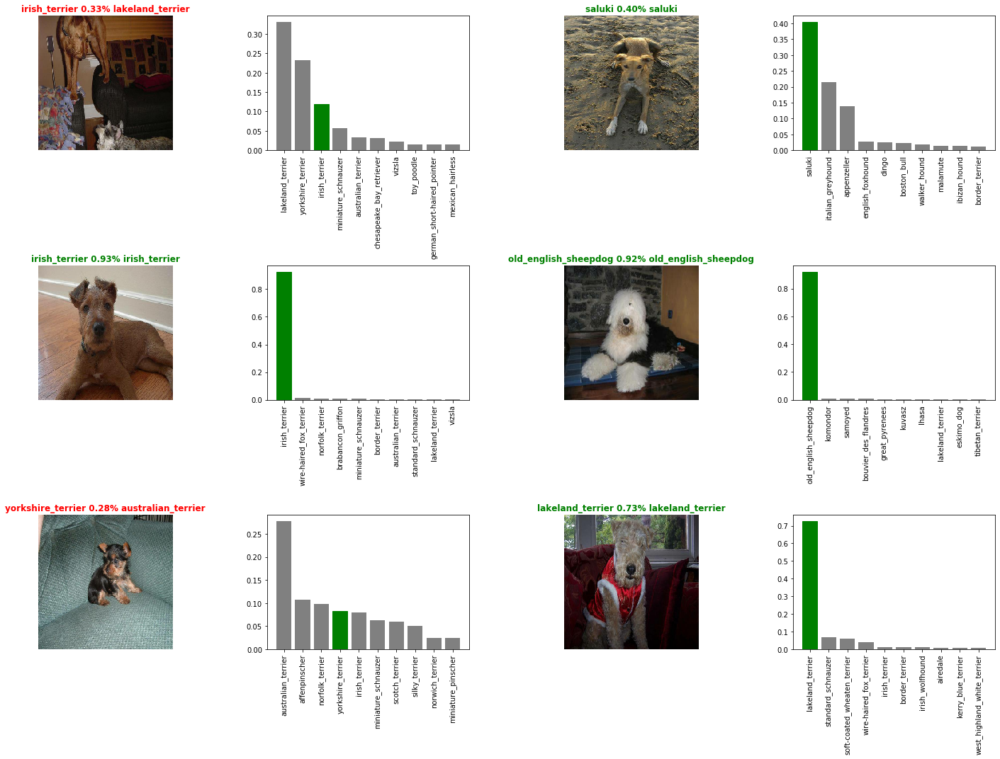

In [142]:
i_mul = 150
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(20,15))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(val_label, prediction, val_image, i+i_mul)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(val_label, prediction, i+i_mul)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving a Trained Model:

In [99]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  modeldir = os.path.join("models/")
  model_path = modeldir + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [100]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [101]:
## Saving the model:
save_model(model, "1000_images_Adam")

Saving model to: models/1000_images_Adam.h5...


'models/1000_images_Adam.h5'

In [102]:
loaded_1000_image_model = load_model('models/1000_images_Adam.h5')

Loading saved model from: models/1000_images_Adam.h5


In [103]:
model.evaluate(valid_data)

7/7 [==============================] - 10s 1s/step - loss: 1.1469 - accuracy: 0.6750


[1.1469147205352783, 0.675000011920929]

In [104]:
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 9s 1s/step - loss: 1.1469 - accuracy: 0.6750


[1.1469147205352783, 0.675000011920929]

## Training the Model on Full Dataset:

In [105]:
len(X), len(Y)

(10222, 10222)

In [106]:
full_data = create_data_batches(X, Y)

Creating Training Data Batches...


In [107]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [108]:
full_model = create_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [109]:
# callback for complete model:
full_model_tensorboard = tensorboard_callback()
# early stopping for complete model(no validation set):
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience= 3)


In [112]:
full_model.fit(x= full_data,
                epochs= NUM_EPOCH,
                callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
  2/320 [..............................] - ETA: 21:39 - loss: 6.0276 - accuracy: 0.0000e+00WARNING:tensorflow:Method (on_train_batch_end) is slow compared to the batch update (2.896816). Check your callbacks.


320/320 [==============================] - 621s 2s/step - loss: 1.3479 - accuracy: 0.6695
Epoch 2/100
320/320 [==============================] - 642s 2s/step - loss: 0.4065 - accuracy: 0.8754
Epoch 3/100
320/320 [==============================] - 618s 2s/step - loss: 0.2388 - accuracy: 0.9331
Epoch 4/100
320/320 [==============================] - 611s 2s/step - loss: 0.1553 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 616s 2s/step - loss: 0.1055 - accuracy: 0.9801
Epoch 6/100
320/320 [==============================] - 615s 2s/step - loss: 0.0773 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 580s 2s/step - loss: 0.0560 - accuracy: 0.9926
Epoch 8/100
320/320 [==============================] - 592s 2s/step - loss: 0.0455 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 585s 2s/step - loss: 0.0376 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 604s 2s/step - loss: 0.0300 - accuracy

In [113]:
save_model(full_model, "full_dataset_model_mobilenetv2_Adam")

Saving model to: models/full_dataset_model_mobilenetv2_Adam.h5...


'models/full_dataset_model_mobilenetv2_Adam.h5'

In [114]:
loaded_full_model= load_model('models/full_dataset_model_mobilenetv2_Adam.h5')

Loading saved model from: models/full_dataset_model_mobilenetv2_Adam.h5


## Making Prediction on Test Data Set

In [115]:
test_path = "test/"
test_filename = [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['test/000621fb3cbb32d8935728e48679680e.jpg',
 'test/00102ee9d8eb90812350685311fe5890.jpg',
 'test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'test/002f80396f1e3db687c5932d7978b196.jpg',
 'test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [116]:
len(test_filename)

10357

In [117]:
test_data = create_data_batches(test_filename, test_data= True)

Creating Test Data Batches...


In [118]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [119]:
test_prediction = loaded_full_model.predict(test_data,  
                                             verbose=1)

324/324 [==============================] - 639s 2s/step


In [120]:
test_prediction

array([[5.3318714e-11, 8.3922227e-12, 7.2443001e-15, ..., 4.7287830e-13,
        1.2827318e-09, 1.6066515e-10],
       [7.6136180e-06, 1.1983672e-05, 1.5016951e-07, ..., 3.1071495e-10,
        4.9871386e-07, 8.1037914e-09],
       [8.8930821e-11, 4.7868857e-06, 1.2845339e-08, ..., 2.7625588e-06,
        1.6235885e-09, 3.9040122e-11],
       ...,
       [8.0675608e-09, 6.0352061e-09, 6.3662287e-07, ..., 5.5520740e-12,
        1.3053879e-07, 1.7872153e-09],
       [1.5915911e-04, 1.3505842e-06, 2.5187779e-08, ..., 1.7304721e-08,
        1.1576405e-05, 4.4104636e-05],
       [3.9550798e-08, 3.9161304e-07, 2.7951526e-07, ..., 3.2554567e-03,
        1.0349312e-08, 9.4547412e-11]], dtype=float32)

In [121]:
max(test_prediction[0])

0.999998

In [122]:
# # Saving Prediictons:
np.savetxt("test_preds_array.csv", test_prediction, delimiter=",")

In [123]:
test_preds = np.loadtxt("test_preds_array.csv", delimiter=",")

In [124]:
test_preds

array([[5.33187140e-11, 8.39222268e-12, 7.24430010e-15, ...,
        4.72878301e-13, 1.28273181e-09, 1.60665148e-10],
       [7.61361798e-06, 1.19836723e-05, 1.50169512e-07, ...,
        3.10714954e-10, 4.98713860e-07, 8.10379142e-09],
       [8.89308210e-11, 4.78688571e-06, 1.28453390e-08, ...,
        2.76255878e-06, 1.62358849e-09, 3.90401218e-11],
       ...,
       [8.06756084e-09, 6.03520611e-09, 6.36622872e-07, ...,
        5.55207399e-12, 1.30538794e-07, 1.78721526e-09],
       [1.59159114e-04, 1.35058417e-06, 2.51877790e-08, ...,
        1.73047212e-08, 1.15764051e-05, 4.41046359e-05],
       [3.95507982e-08, 3.91613042e-07, 2.79515262e-07, ...,
        3.25545669e-03, 1.03493116e-08, 9.45474116e-11]])

In [125]:
len(test_preds), len(test_preds[0])

(10357, 120)

## Converting into Required Format: 
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation


In [126]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breed))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [127]:
test_id = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_id[:5]

['000621fb3cbb32d8935728e48679680e',
 '00102ee9d8eb90812350685311fe5890',
 '0012a730dfa437f5f3613fb75efcd4ce',
 '001510bc8570bbeee98c8d80c8a95ec1',
 '001a5f3114548acdefa3d4da05474c2e']

In [128]:
preds_df["id"] = test_id
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
preds_df[list(unique_breed)] = test_preds # or test_preds
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,5.33187e-11,8.39222e-12,7.2443e-15,1.72274e-12,1.47225e-12,1.51902e-11,1.08835e-15,1.25678e-12,2.60229e-13,...,6.57139e-12,2.25494e-12,1.24749e-13,4.09582e-14,3.29233e-13,7.69771e-12,1.33329e-12,4.72878e-13,1.28273e-09,1.60665e-10
1,00102ee9d8eb90812350685311fe5890,7.61362e-06,1.19837e-05,1.5017e-07,3.99139e-09,3.26435e-06,3.57455e-08,9.50111e-06,8.88426e-07,6.83166e-08,...,2.78843e-08,3.41473e-06,2.87733e-08,7.09e-06,8.32889e-08,3.57342e-07,0.000361255,3.10715e-10,4.98714e-07,8.10379e-09
2,0012a730dfa437f5f3613fb75efcd4ce,8.89308e-11,4.78689e-06,1.28453e-08,3.04641e-10,1.36475e-09,2.22145e-08,1.60335e-10,3.46494e-11,2.41095e-08,...,3.49953e-12,1.48948e-10,1.65239e-07,9.13841e-07,1.04158e-07,2.69501e-07,1.35215e-11,2.76256e-06,1.62359e-09,3.90401e-11
3,001510bc8570bbeee98c8d80c8a95ec1,1.91536e-06,1.51617e-07,3.56782e-07,1.54592e-05,0.000154238,3.1878e-06,2.72761e-10,6.08224e-09,6.03769e-08,...,4.17188e-06,1.96826e-10,1.67242e-05,9.73296e-10,3.61449e-07,5.36499e-09,1.07625e-14,0.0203719,2.41836e-10,2.95519e-07
4,001a5f3114548acdefa3d4da05474c2e,7.61138e-05,2.51342e-05,5.10026e-09,3.53357e-09,2.68384e-09,6.45355e-11,4.69036e-10,1.23612e-08,9.08228e-09,...,1.91124e-07,6.95308e-11,2.50475e-10,1.2283e-10,1.37077e-09,1.02584e-09,6.93309e-11,1.39848e-07,6.75149e-10,5.62064e-08


In [130]:
preds_df.to_csv("full_model_prediction_on_mobilenetV2_for_submission.csv",
                 index= False)

## Testing on Custom Images:


In [131]:
custom_path = "custom images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [132]:
custom_image_paths

['custom images/02da6a0076ed61c526fda7e1ac0da986.jpg',
 'custom images/afghanskychrt.jpg',
 'custom images/appenzeller-sennenhund-im-grass-768x576.jpg',
 'custom images/Cairn-Terrier-sitting-in-the-grass.jpg',
 'custom images/Male_fawn_Boxer_undocked.jpg']

In [133]:
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating Test Data Batches...


In [134]:
custom_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [135]:
custom_preds = loaded_full_model.predict(custom_data, verbose=1)

1/1 [==============================] - 0s 5ms/step


In [136]:
custom_preds.shape

(5, 120)

In [137]:
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['rottweiler', 'afghan_hound', 'appenzeller', 'cairn', 'boxer']

In [138]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

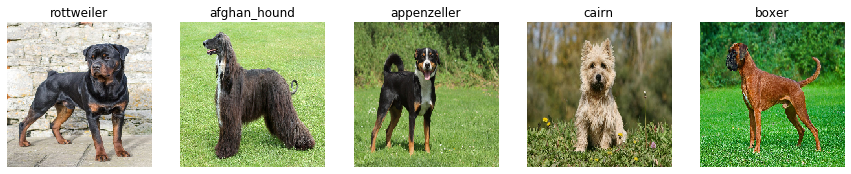

In [139]:
plt.figure(figsize=(15,10))
for i, image  in enumerate(custom_images):
  plt.subplot(1,5,i+1)
  plt.axis("off")
  plt.title(custom_preds_labels[i])
  plt.imshow(image)